<a href="https://colab.research.google.com/github/olonok69/Deep_learning_Image_Caption/blob/master/devise_pytorch.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
from pathlib import Path
import os
import pickle
import shutil
import json,re
import pandas as pd
import numpy as np
import random
from PIL import Image
import torchvision.models as models
import matplotlib.pyplot as plt
import torchvision.transforms as transforms
from torch.utils.data import Dataset, DataLoader
import torch.nn.functional as F
import torch
from torch import nn
from torchvision.utils import make_grid
from tqdm.notebook import tqdm
import fasttext as ft
from gensim.models.wrappers import FastText
import jovian
%matplotlib inline

In [ ]:
PATH = Path('D:/datasets')
FASTTEXT_PATH = PATH/"fasttext_vectors"
CALTECH256_PATH = PATH/"caltech-256/256_ObjectCategories"

In [ ]:
ft_vecs = ft.load_model(str((FASTTEXT_PATH/'cc.en.300.bin')))

In [ ]:
ft_words = ft_vecs.get_words(include_freq=True)
ft_word_dict = {k:v for k,v in zip(*ft_words)}
ft_words = sorted(ft_word_dict.keys(), key=lambda x: ft_word_dict[x])

len(ft_words)

2000000

In [ ]:
lc_vec_d = {w.lower(): ft_vecs.get_word_vector(w) for w in ft_words[-1000000:]}

In [ ]:
test_classes = ["bear","piano","laptop","syringe","tomato","calculator","rifle","dog","floppy","octopus"]
classes = []
train_images = []
train_img_vecs = []
test_images = []
test_img_vecs = []
for class_name in CALTECH256_PATH.iterdir():
    c = class_name.name.rpartition(".")[-1]
    if c in lc_vec_d:
        class_images = list(class_name.iterdir())
        if c in test_classes:
            test_images += class_images
            test_img_vecs += [lc_vec_d[c]]*len(class_images)
        else:
            classes.append(c)
            train_images += class_images
            train_img_vecs += [lc_vec_d[c]]*len(class_images)

In [ ]:
train_img_vecs = np.stack(train_img_vecs)
test_img_vecs  = np.stack(test_img_vecs)
train_img_vecs.shape,test_img_vecs.shape

((26061, 300), (1041, 300))

In [ ]:
pickle.dump(train_images, Path('./train_images.pkl').open('wb'))
pickle.dump(test_images, Path('./test_images.pkl').open('wb'))

pickle.dump(train_img_vecs, Path('./train_img_vecs.pkl').open('wb'))
pickle.dump(test_img_vecs, Path('./test_img_vecs.pkl').open('wb'))

In [ ]:
train_images = pickle.load(Path('./train_images.pkl').open('rb'))
test_images = pickle.load(Path('./test_images.pkl').open('rb'))

train_img_vecs = pickle.load(Path('./train_img_vecs.pkl').open('rb'))
test_img_vecs = pickle.load(Path('./test_img_vecs.pkl').open('rb'))

In [ ]:
split=int(len(train_images)*0.75)
split

19545

In [ ]:
grouped = list(zip(train_images, train_img_vecs)) 
random.shuffle(grouped) 
train_images, train_img_vecs = zip(*grouped)

In [ ]:
train_images,valid_images = train_images[:split],train_images[split:]
train_vecs,  valid_vecs   = train_img_vecs[:split],train_img_vecs[split:]

In [ ]:
pickle.dump(train_images, Path('./train_images.pkl').open('wb'))
pickle.dump(valid_images, Path('./valid_images.pkl').open('wb'))
pickle.dump(test_images, Path('./test_images.pkl').open('wb'))

pickle.dump(train_vecs, Path('./train_vecs.pkl').open('wb'))
pickle.dump(valid_vecs, Path('./valid_vecs.pkl').open('wb'))
pickle.dump(test_img_vecs, Path('./test_images_vecs.pkl').open('wb'))

In [ ]:
train_images = pickle.load(Path('./train_images.pkl').open('rb'))
valid_images = pickle.load(Path('./valid_images.pkl').open('rb'))
test_images  = pickle.load(Path('./test_images.pkl').open('rb'))

train_vecs = pickle.load(Path('./train_vecs.pkl').open('rb'))
valid_vecs = pickle.load(Path('./valid_vecs.pkl').open('rb'))
test_images_vecs = pickle.load(Path('./test_images_vecs.pkl').open('rb'))

In [ ]:
class DeviseDataset(Dataset):
    def __init__(self, images, vecs, transform=None):
        self.images = images
        self.vecs = vecs
        self.transform = transform
        
    def __len__(self):
        return len(self.images)    
    
    def __getitem__(self, idx):
        img_path = self.images[idx]
        img_vec = self.vecs[idx]
        img = Image.open(img_path).convert("RGB")
        if self.transform:
            img = self.transform(img)
        return img, img_vec

In [ ]:
transform  = transforms.Compose([transforms.Resize(size=(200,200)),
                                 transforms.ToTensor(),
                                 transforms.Normalize(mean=[0.485, 0.456, 0.406],std=[0.229, 0.224, 0.225])])
train_dataset = DeviseDataset(train_images,train_vecs,transform)
valid_dataset = DeviseDataset(valid_images,valid_vecs,transform)
test_dataset = DeviseDataset(test_images,valid_vecs,transform)

In [ ]:
def denorm(img,mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]):
    return img*torch.Tensor(std).unsqueeze(1).unsqueeze(1)+torch.Tensor(mean).unsqueeze(1).unsqueeze(1)
def show_sample(img, target, invert=True):
    img = denorm(img).clamp(0,1)
    if invert:
        plt.imshow(1 - img.permute((1, 2, 0)))
    else:
        plt.imshow(img.permute(1, 2, 0))

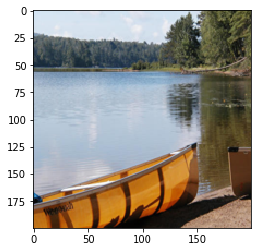

In [ ]:
show_sample(*train_dataset[0], invert=False)

In [ ]:
batch_size = 64

In [ ]:
train_dl = DataLoader(train_dataset, batch_size, shuffle=True, num_workers=0, pin_memory=True)
val_dl = DataLoader(valid_dataset, batch_size*2, shuffle=False, num_workers=0, pin_memory=True)
test_dl = DataLoader(test_dataset, batch_size*2, shuffle=False, num_workers=0, pin_memory=True)

In [ ]:
def show_batch(dl):
    for images, labels in dl:
        fig, ax = plt.subplots(figsize=(16, 8))
        ax.set_xticks([]); ax.set_yticks([])
        data = denorm(images).clamp(0,1)
        ax.imshow(make_grid(data, nrow=16).permute(1, 2, 0))
        break

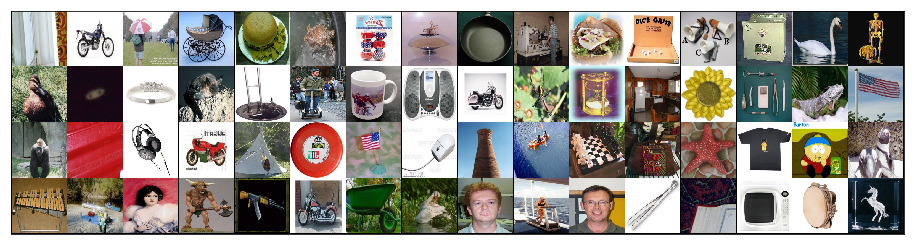

In [ ]:
show_batch(train_dl)

In [ ]:
class TrainerBase(nn.Module):
    def training_step(self, batch):
        images, targets = batch 
        out = self(images)                      
        loss = 1 - F.cosine_similarity(out,targets).mean()
        return loss
    
    def validation_step(self, batch):
        images, targets = batch 
        out = self(images)
        loss = 1 - F.cosine_similarity(out,targets).mean()
        return {'val_loss': loss.detach()}
        
    def validation_epoch_end(self, outputs):
        batch_losses = [x['val_loss'] for x in outputs]
        epoch_loss = torch.stack(batch_losses).mean()   # Combine losses
        return {'val_loss': epoch_loss.item()}
    
    def epoch_end(self, epoch, result):
        print("Epoch [{}], train_loss: {:.4f}, val_loss: {:.4f}".format(
            epoch, result['train_loss'], result['val_loss']))

In [ ]:
class AdaptiveConcatPool2d(nn.Module):
    def __init__(self, sz=1):
        super().__init__()
        self.adavgp = nn.AdaptiveAvgPool2d(sz)
        self.adamaxp = nn.AdaptiveMaxPool2d(sz)
    def forward(self, x):
        x = torch.cat([self.adavgp(x), self.adamaxp(x)], 1)
        x = x.view(x.size(0),-1)
        return x

In [ ]:
class DeviseModel(TrainerBase):
    def __init__(self):
        super().__init__()
        # Use a pretrained model
        self.network = models.resnet18(pretrained=True)
        # Replace last layer
        num_ftrs = self.network.fc.in_features
        self.network.fc = nn.Sequential(nn.Flatten(),
                                       nn.Dropout(p=0.25),
                                       nn.Linear(in_features=num_ftrs,out_features=num_ftrs//2),
                                       nn.ReLU(inplace=True),
                                       nn.BatchNorm1d(num_ftrs//2),
                                       nn.Dropout(p=0.5),
                                       nn.Linear(num_ftrs//2,300))    
    def forward(self, xb):
        return self.network(xb)

In [ ]:
def get_default_device():
    """Pick GPU if available, else CPU"""
    if torch.cuda.is_available():
        return torch.device('cuda')
    else:
        return torch.device('cpu')
    
def to_device(data, device):
    """Move tensor(s) to chosen device"""
    if isinstance(data, (list,tuple)):
        return [to_device(x, device) for x in data]
    return data.to(device, non_blocking=True)

class DeviceDataLoader():
    """Wrap a dataloader to move data to a device"""
    def __init__(self, dl, device):
        self.dl = dl
        self.device = device
        
    def __iter__(self):
        """Yield a batch of data after moving it to device"""
        for b in self.dl: 
            yield to_device(b, self.device)

    def __len__(self):
        """Number of batches"""
        return len(self.dl)

In [ ]:
device = get_default_device()
device

device(type='cuda')

In [ ]:
train_dl = DeviceDataLoader(train_dl, device)
val_dl = DeviceDataLoader(val_dl, device)
test_dl = DeviceDataLoader(test_dl, device)
model = to_device(DeviseModel(), device)

In [ ]:
@torch.no_grad()
def evaluate(model, val_loader):
    model.eval()
    outputs = [model.validation_step(batch) for batch in val_loader]
    return model.validation_epoch_end(outputs)

def fit(epochs, lr, model, train_loader, val_loader, opt_func=torch.optim.SGD):
    torch.cuda.empty_cache()
    history = []
    optimizer = opt_func(model.parameters(), lr)
    for epoch in range(epochs):
        # Training Phase 
        model.train()
        train_losses = []
        for batch in tqdm(train_loader):
            loss = model.training_step(batch)
            train_losses.append(loss)
            loss.backward()
            optimizer.step()
            optimizer.zero_grad()
        # Validation phase
        result = evaluate(model, val_loader)
        result['train_loss'] = torch.stack(train_losses).mean().item()
        model.epoch_end(epoch, result)
        history.append(result)
    return history

In [ ]:
for param in list(model.parameters()):
    param.requires_grad = True
for param in list(model.parameters())[:-8]:
    param.requires_grad = False

In [ ]:
num_epochs = 10
opt_func = torch.optim.Adam
lr = 3e-3

In [ ]:
history = fit(num_epochs, lr, model, train_dl, val_dl, opt_func)


Epoch [0], train_loss: 0.5120, val_loss: 0.4084



Epoch [1], train_loss: 0.4410, val_loss: 0.3863



Epoch [2], train_loss: 0.4290, val_loss: 0.3711



Epoch [3], train_loss: 0.4231, val_loss: 0.3678



Epoch [4], train_loss: 0.4190, val_loss: 0.3585



Epoch [5], train_loss: 0.4153, val_loss: 0.3547



Epoch [6], train_loss: 0.4122, val_loss: 0.3518



Epoch [7], train_loss: 0.4099, val_loss: 0.3487



Epoch [8], train_loss: 0.4074, val_loss: 0.3460



Epoch [9], train_loss: 0.4040, val_loss: 0.3443


In [ ]:
torch.save(model.state_dict(),"devise_resnet18.pth")

In [ ]:
@torch.no_grad()
def predict_dl_batch(dl, model):
    torch.cuda.empty_cache()
    batch_probs = []
    model.eval()
    for xb, _ in tqdm(dl):
        pred_wv = model(xb.cuda())
        batch_probs.append(pred_wv.cpu().detach())
    batch_probs = torch.cat(batch_probs)
    return batch_probs.numpy()

In [ ]:
pred_wvs = predict_dl_batch(val_dl,model)

In [ ]:
import nmslib

def create_index(a):
    index = nmslib.init(space='angulardist')
    index.addDataPointBatch(a)
    index.createIndex()
    return index

def get_knns(index, vecs):
     return zip(*index.knnQueryBatch(vecs, k=10, num_threads=4))

def get_knn(index, vec): return index.knnQuery(vec, k=10)

In [ ]:
def show_preds(idxs,dset="valid"):
    if dset == "valid":
        dataset = valid_dataset
        images = valid_images
    elif dset == "test":
        dataset = test_dataset
        images = test_images
    fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(8,8))
    for ax,img_idx in zip(axes.flatten(),idxs[:9]):
        p=Path(images[img_idx])
        data = denorm(dataset[img_idx][0]).clamp(0,1)
        data = data.permute(1,2,0).numpy()
        ax.imshow(data)
        title = p.parent.name.rpartition(".")[-1]
        ax.set_title(title)
        ax.axis("off")

In [ ]:
nn_predwv = create_index(pred_wvs)

# Keyword Search

In [ ]:
"fireworks" in classes

True

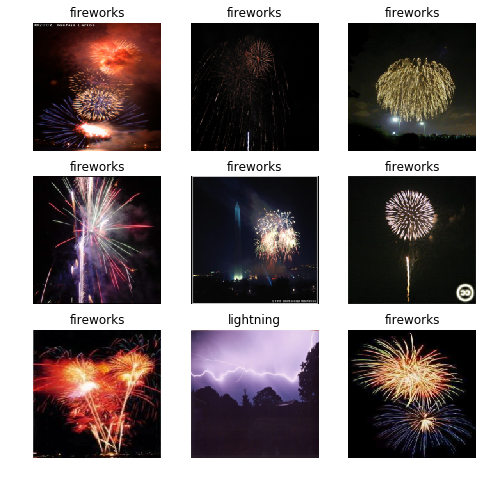

In [ ]:
vec = ft_vecs.get_word_vector('fireworks')
idxs,dists = get_knn(nn_predwv, vec)
show_preds(idxs)

In [ ]:
"sea" in classes

False

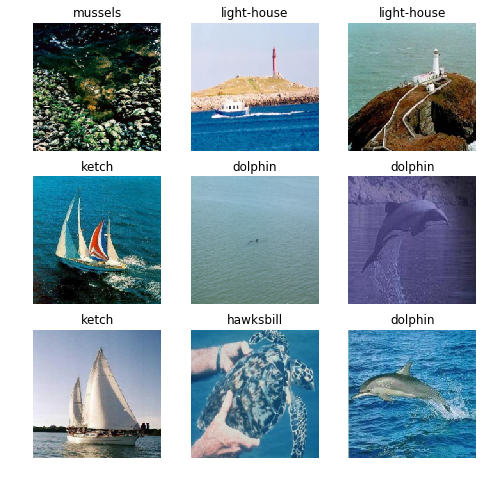

In [ ]:
vec = ft_vecs.get_word_vector('sea')
idxs,dists = get_knn(nn_predwv, vec)
show_preds(idxs)

In [ ]:
"food" in classes

False

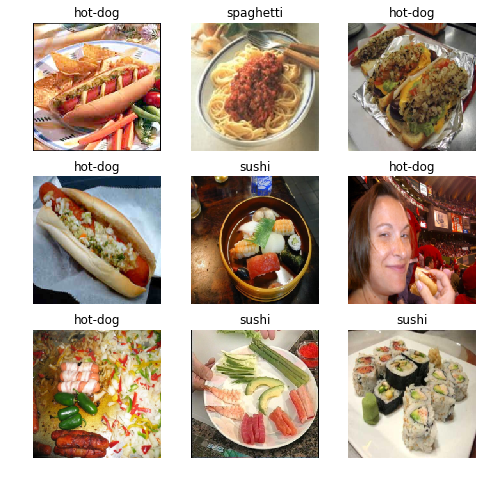

In [ ]:
vec = ft_vecs.get_word_vector('food')
idxs,dists = get_knn(nn_predwv, vec)
show_preds(idxs)

# Image reverse search

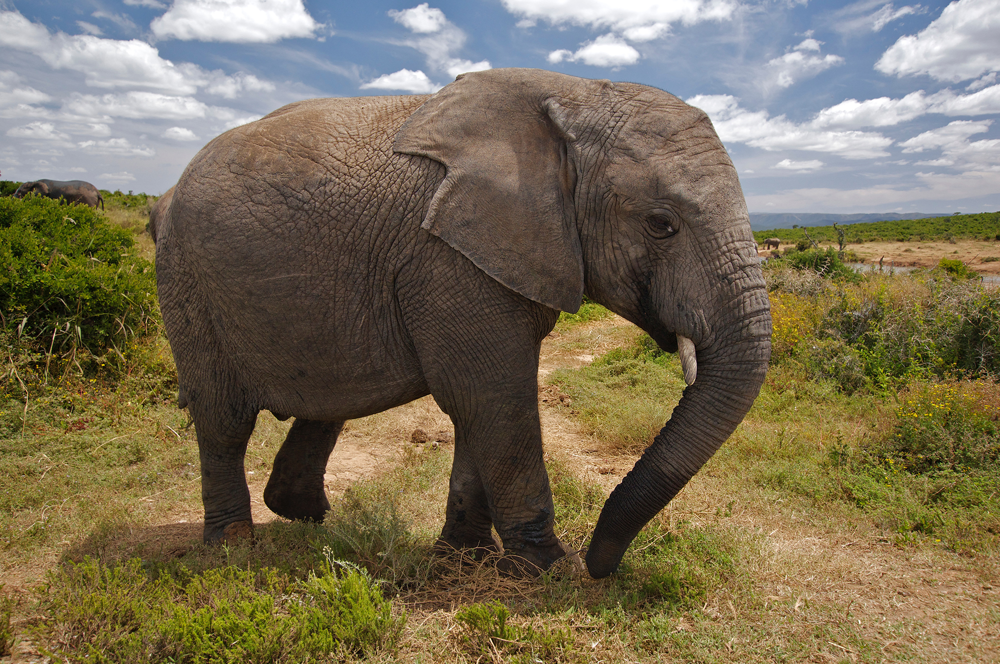

In [ ]:
img=Image.open("./elephant.jpg")
img

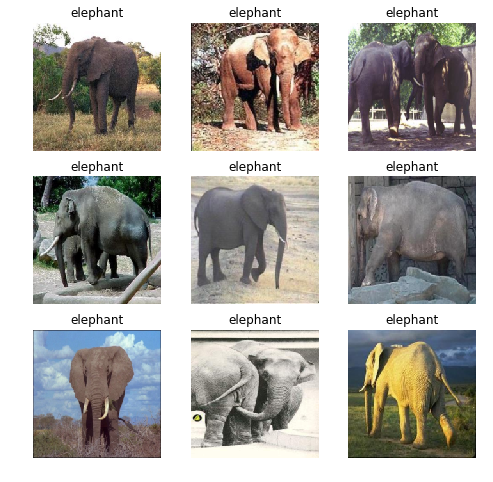

In [ ]:
img=img.resize(size=(200,200))
pred_img=model(transform(img).unsqueeze(0).cuda())
idxs,dists = get_knn(nn_predwv, pred_img.cpu().detach().numpy())
show_preds(idxs)

# Image to Keyword

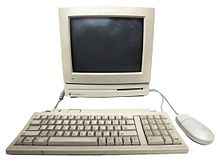

In [ ]:
image=Image.open("./desktop.jpg")
image

In [ ]:
image = image.resize(size=(200,200))
pred_vec = model(transform(image).unsqueeze(0).cuda())
pred_vec = pred_vec.cpu().detach().numpy()

In [ ]:
del ft_vecs

In [ ]:
from gensim.models.wrappers import FastText
ft_model = FastText.load_fasttext_format(str((FASTTEXT_PATH/'cc.en.300.bin')))

In [ ]:
ret_vals = ft_model.similar_by_vector(pred_vec[0],topn=20)

In [ ]:
ret_vals

[('monitor', 0.7612738013267517),
 ('monitors', 0.6604044437408447),
 ('moniter', 0.6182242631912231),
 ('monitor.The', 0.6030506491661072),
 ('monitor.', 0.5873944759368896),
 ('monitor.I', 0.5799990296363831),
 ('montior', 0.5760090351104736),
 ('treadmill', 0.5758589506149292),
 ('moniters', 0.5740747451782227),
 ('computer', 0.5730982422828674),
 ('monitor.If', 0.5552287101745605),
 ('laptop', 0.5374889373779297),
 ('LCD', 0.5278236865997314),
 ('flatscreen', 0.519569993019104),
 ('calibrate', 0.5149523019790649),
 ('monitoring', 0.5112462043762207),
 ('VCR', 0.5088993310928345),
 ('refrigerator', 0.5079336166381836),
 ('flatpanel', 0.5048204660415649),
 ('monitors.The', 0.5041607618331909)]

# Keyword search on Test set

In [ ]:
test_classes

['bear',
 'piano',
 'laptop',
 'syringe',
 'tomato',
 'calculator',
 'rifle',
 'dog',
 'floppy',
 'octopus']

In [ ]:
test_pred_wvs = predict_dl_batch(test_dl,model)

In [ ]:
test_nn_predwv = create_index(test_pred_wvs)

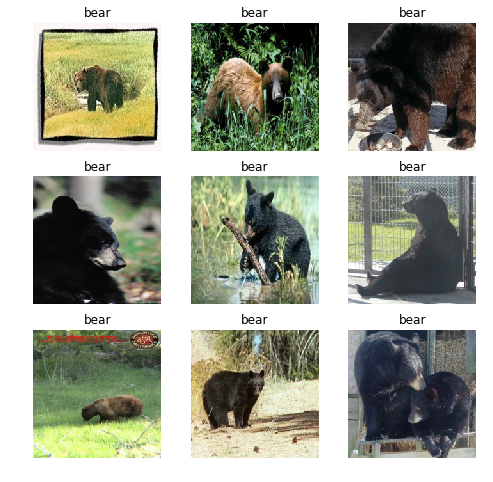

In [ ]:
vec = ft_model.wv['bear']
idxs,dists = get_knn(test_nn_predwv, vec)
show_preds(idxs,dset="test")

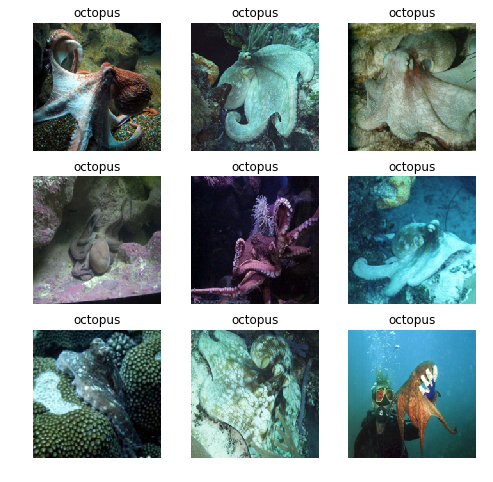

In [ ]:
vec = ft_model.wv['nemo']
idxs,dists = get_knn(test_nn_predwv, vec)
show_preds(idxs,dset="test")

In [ ]:
import jovian
jovian.commit(filename="devise_pytorch",project="devise_pytorch", environment=None)

<IPython.core.display.Javascript object>

[jovian] Attempting to save notebook..
